<a href="https://colab.research.google.com/github/sisqodataclub/ml-ds/blob/main/CS98X_TASK2_g34.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

collab link: https://colab.research.google.com/drive/1QNB9tx9sxZKnDQo2wLSxiCFKFQwUW9JL?usp=sharing



# OVERVIEW/SUMMARY


## STUDENT GRADE PREDICTION

DATASET AND COMPETITION LINK:  https://www.kaggle.com/competitions

### Gropu 34/SA
GROUP MEMBERS: Francis Darko,
               Aryan Arora,
               Siddhi Gupta,
               Emmanouil Alexakis


The objective of this task is to employ baseline and neural networks machine learning models to predict student grades and investigate the impact of different architectures and hyper-parameters settings on effectiveness. The performances of these models were evaluated and anlyse.

In this project the neural network model employed is based on the popular multilayer perceptron with one hidden layer and a functional neural network, wide and deep with two hidden layers. All experiments were conducted using google colab with sklearn library, matplotip, pandas, tenserflow and few other libraries


###FINDINGS

The results shows that a good predictive model can be achieved with deep learnng approach as they outperform the baseline logistic regression model. The two deepp learning base approaches provided an accuracy score percentage over 96% on cross validation, training, validation and test set, while the logistic regression reached a maximum of 96% accuracy on test score.



# METHODOLOGY

### IMPORT DATASET FROM KAGGLE

In [ ]:
#UPLOAD KAGGLE API ID
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"francisdarko","key":"8cca70855da304cc76cf47b8b1231633"}'}

In [ ]:
# store the `kaggle.json` in to a hidden directory called `.kaggle`.
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/kaggle.json
!chmod 600 /root/.kaggle/kaggle.json #change the security permissions

In [ ]:
# pip install kaggle to issue Kaggle comamnds.
!pip install kaggle

In [ ]:
# Download Kaggle Competition Dataset
!kaggle competitions download -c cs98x-22-dl-task2

  0% 0.00/409k [00:00<?, ?B/s]
100% 409k/409k [00:00<00:00, 54.8MB/s]


In [ ]:
#save dataset on your drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#unzip the dataset
!unzip cs98x-22-dl-task2.zip

Archive:  cs98x-22-dl-task2.zip
  inflating: test.csv                
  inflating: train.csv               


In [ ]:
import pandas as pd
# load training & test datasets to pandas as dataframe
train = pd.read_csv("/content/train.csv")
test = pd.read_csv("/content/test.csv")


In [ ]:
# Import the following commands for this project
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import load_iris
from sklearn.linear_model import Perceptron

In [ ]:
%tensorflow_version 2.x
import tensorflow as tf
from tensorflow import keras
print(tf.__version__)
print(keras.__version__)
from keras.utils.vis_utils import plot_model

2.8.0
2.8.0


# EXPLANATORY ANALYSIS


### DATASET INFORMATION

We use pandas profiling package to produce an overview of our dataset


In [ ]:
#check column names
train.columns

Index(['id', 'school', 'sex', 'age', 'address', 'famsize', 'Pstatus', 'Medu',
       'Fedu', 'Mjob', 'Fjob', 'reason', 'guardian', 'traveltime', 'studytime',
       'failures', 'schoolsup', 'famsup', 'paid', 'activities', 'nursery',
       'higher', 'internet', 'romantic', 'famrel', 'freetime', 'goout', 'Dalc',
       'Walc', 'health', 'absences', 'G1', 'G2', 'Grade'],
      dtype='object')

In [ ]:
#see the first 6 rows of the data
train.head()

,id,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,...,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,Grade
0,0,GP,F,16,U,GT3,A,0,3,teacher,...,5,4,2,1,0,4,2,8,13,7
1,1,MS,M,17,U,GT3,T,4,0,other,...,4,2,4,2,2,1,28,12,10,12
2,2,MS,F,17,U,LE3,T,1,0,services,...,4,4,2,1,2,2,3,11,9,8
3,3,GP,M,17,R,LE3,T,2,2,health,...,2,4,2,2,2,4,2,16,15,9
4,4,MS,F,14,R,LE3,T,0,1,health,...,3,3,2,2,1,4,0,9,14,8


In [ ]:
#set id as index
train.set_index('id', inplace=True)
test.set_index('id', inplace=True)



Pandas profiling is an open source Python module with which we can quickly do an exploratory data analysis with just a few lines of code.

In [ ]:
!pip install -U pandas-profiling

     |████████████████████████████████| 261 kB 5.2 MB/s 
     |████████████████████████████████| 690 kB 66.9 MB/s 
     |████████████████████████████████| 3.1 MB 50.4 MB/s 
     |████████████████████████████████| 10.9 MB 36.9 MB/s 
     |████████████████████████████████| 303 kB 60.1 MB/s 
     |████████████████████████████████| 596 kB 55.5 MB/s 
     |████████████████████████████████| 102 kB 13.4 MB/s 
     |████████████████████████████████| 63 kB 1.5 MB/s 
     |████████████████████████████████| 812 kB 61.8 MB/s 
     |████████████████████████████████| 38.1 MB 1.2 MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=8e41a004d158f1494969b20f61ea9f212b92909696378cfea8cfb321ac1be22d
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655
  Created wheel for imagehash: filename=ImageHash-4.2.1-py2.py3-none-any.whl size=295206 sha256=a26bcd4b215f1b10f6881a502c2aa92f11e752fbf937bdc4287d5e3634bddeaa
 

In [ ]:
import pandas_profiling


In [ ]:
train.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## CHECK FOR DUPLICATE AND UNIQUE VALUES
Duplicates in the dataset can lead to incorrect conclusions and overfitting by making uncommon observations appear more common than they really are.

In [ ]:
def dataoveriew (data = train, title= "DUPLICATES AND MISSING VALUES ANALYSIS"):
    print(f'{title}:\n')
    print('Number of rows:\n', data.shape[0])
    print('\nNumber of features:\n', data.shape[1])
    print('\nUnique Values:\n', data.nunique())
    print('\nDuplicate Values:\n', data.duplicated().sum())


In [ ]:
dataoveriew()

DUPLICATES AND MISSING VALUES ANALYSIS:

Number of rows:
 20064

Number of features:
 33

Unique Values:
 school         2
sex            2
age            8
address        2
famsize        2
Pstatus        2
Medu           5
Fedu           5
Mjob           5
Fjob           5
reason         4
guardian       3
traveltime     7
studytime      6
failures       5
schoolsup      2
famsup         2
paid           2
activities     2
nursery        2
higher         2
internet       2
romantic       2
famrel         6
freetime       6
goout          6
Dalc           8
Walc           7
health         6
absences      39
G1            23
G2            23
Grade         13
dtype: int64

Duplicate Values:
 0


# TARGET VARIABLE ANALYSIS

In [ ]:
df_grade = train['Grade']
df_grade.hist(bins=6, figsize=(12,7))
plt.show();

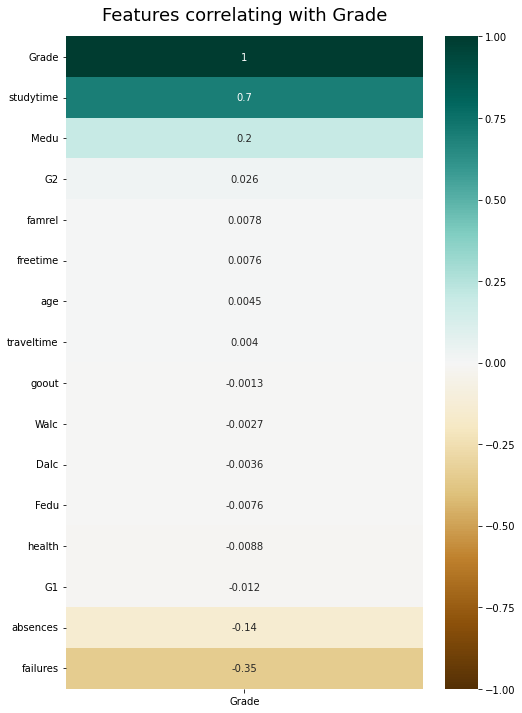

In [ ]:
#Correlation Matrix plot

corr_matrix= train.corr()
import seaborn as sns
plt.figure(figsize=(8,12))
heatmap = sns.heatmap(train.corr()[['Grade']].sort_values(by='Grade', ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Features correlating with Grade', fontdict={'fontsize':18}, pad=16);


In [ ]:
target_v=train[['Grade']].copy()


In [ ]:
#produce a report of our target variable
target_v.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## CATEGORICAL VARIABLE ANALYSIS






In [ ]:
#select categorical variables into a dataframe
cat_var = train.select_dtypes(include=['object'])

cat_var.columns

Index(['school', 'sex', 'address', 'famsize', 'Pstatus', 'Mjob', 'Fjob',
       'reason', 'guardian', 'schoolsup', 'famsup', 'paid', 'activities',
       'nursery', 'higher', 'internet', 'romantic'],
      dtype='object')

In [ ]:
#CATEGORICAL VALUES REPORT OVERVIEW

cat_var.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# GENDER AND AGE ANALYSIS
import seaborn as sns
import matplotlib.pyplot as plt


b = sns.countplot('age', hue ='sex', data = train)
b.axes.set_title('Number of students in different age groups', fontsize=30)
b.set_xlabel("Age", fontsize=30)
b.set_ylabel("Count", fontsize=20)
plt.show()


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


In [ ]:
#Do the Same on the test data as we will need it for encoding
cat_vart = test.select_dtypes(include=['object'])

In [ ]:
#Look for partial duplicates

def catveriew (data = cat_var, title= "CATEGORICAL VARIABLES ANALYSIS"):
    print(f'{title}:\n')
    print('Number of rows:\n', data.shape[0])
    print('\nNumber of features:\n', data.shape[1])
    print('\nUnique Values:\n', data.nunique())
    print('\nDuplicate Values:\n', data.duplicated().sum())

In [ ]:
catveriew()

CATEGORICAL VARIABLES ANALYSIS:

Number of rows:
 20064

Number of features:
 17

Unique Values:
 school        2
sex           2
address       2
famsize       2
Pstatus       2
Mjob          5
Fjob          5
reason        4
guardian      3
schoolsup     2
famsup        2
paid          2
activities    2
nursery       2
higher        2
internet      2
romantic      2
dtype: int64

Duplicate Values:
 2378


In [ ]:
#LOOK FOR PARTIAL DUPLICATES
duplicateRowsDF = cat_var[cat_var.duplicated()]

print("Duplicate Rows except first occurrence based on all columns are :")
print(duplicateRowsDF)

Duplicate Rows except first occurrence based on all columns are :
      school sex address famsize Pstatus      Mjob      Fjob  reason guardian  \
id                                                                              
337       GP   M       U     GT3       T     other     other    home   mother   
473       GP   M       U     GT3       T     other     other    home   mother   
578       MS   F       R     GT3       T  services    health  course   mother   
825       GP   M       U     GT3       A   teacher  services  course   mother   
926       GP   M       U     GT3       T     other     other  course   mother   
...      ...  ..     ...     ...     ...       ...       ...     ...      ...   
20034     MS   M       U     GT3       T   at_home     other    home   mother   
20039     GP   M       R     GT3       T     other  services  course   mother   
20040     GP   F       U     GT3       T     other     other    home    other   
20050     GP   F       R     GT3       T   

# DATA PROCESSING



Following the explanatory data analysis, we discorevers partial duplicates
in the dataset, it is a bit tricky because you don’t really know which one to keep and which one to drop. For our case, we detected 2378 duplicated rows in the columns containing categorical data. Each duplicate value will be unique to for modelling for this reason we will keep all partial duplicate values


## Encoding Categorical Variables
Categorical variables are nominal when there is no particular order and  Ordinal there is order between values. The dataset contains only nominal variables with no particular order for this reason, we will adopt nominal methodology for encoding.



In [ ]:
#select columns with binary categorical variables
cat_varbinary=cat_var.drop(['Mjob','Fjob','reason','guardian'], axis=1)
cat_varbinaryt=cat_vart.drop(['Mjob','Fjob','reason','guardian'], axis=1)

In [ ]:
#extract categorical columns trainset
cat_var_ind= list(cat_var)

In [ ]:
#extract categorical features on test set
cat_var_indt= list(cat_vart)

In [ ]:
cat_var_ind

['school',
 'sex',
 'address',
 'famsize',
 'Pstatus',
 'Mjob',
 'Fjob',
 'reason',
 'guardian',
 'schoolsup',
 'famsup',
 'paid',
 'activities',
 'nursery',
 'higher',
 'internet',
 'romantic']

In [ ]:
# Encode Categorical Variables on both train and test set
df = pd.get_dummies(data=train, columns = cat_var_ind)

In [ ]:
dft = pd.get_dummies(data=test, columns = cat_var_indt)

In [ ]:
# View all new columns created
df.columns

Index(['age', 'Medu', 'Fedu', 'traveltime', 'studytime', 'failures', 'famrel',
       'freetime', 'goout', 'Dalc', 'Walc', 'health', 'absences', 'G1', 'G2',
       'Grade', 'school_GP', 'school_MS', 'sex_F', 'sex_M', 'address_R',
       'address_U', 'famsize_GT3', 'famsize_LE3', 'Pstatus_A', 'Pstatus_T',
       'Mjob_at_home', 'Mjob_health', 'Mjob_other', 'Mjob_services',
       'Mjob_teacher', 'Fjob_at_home', 'Fjob_health', 'Fjob_other',
       'Fjob_services', 'Fjob_teacher', 'reason_course', 'reason_home',
       'reason_other', 'reason_reputation', 'guardian_father',
       'guardian_mother', 'guardian_other', 'schoolsup_no', 'schoolsup_yes',
       'famsup_no', 'famsup_yes', 'paid_no', 'paid_yes', 'activities_no',
       'activities_yes', 'nursery_no', 'nursery_yes', 'higher_no',
       'higher_yes', 'internet_no', 'internet_yes', 'romantic_no',
       'romantic_yes'],
      dtype='object')

# FEATURE SELECTION

Following the encoding of categorical variables the number of columns became 58. For the logistic regression model, we first fit a model with all the features, then we used elastic net for regularisation and feature selection.

Due to neural networks capability of handling large amount of features we implemented variance threshold feature selection method with variance at 0.1 to remove constant features


## VALIDATION SET

Note that the dataset for this analysis is already split into a training set and a test set. To check for overfitting, we will create an additional validational set. We adopt stratify sampling method to split the dataset.
This methodology splits so that the proportion of values in the sample produced will be the same as the proportion of values provided to parameter stratify.


In [ ]:
#seperate the features
X=df.drop('Grade',axis=1)
Y=df['Grade']

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_valid,y_train,y_valid = train_test_split(X, Y, stratify=Y, test_size = 0.2,random_state = 42)

### MODELS

#### LOGISTIC REGRESSION
For this task we will first implement a base line machine learning model. For this project Logistic regression was chosen.

The Logistic regression model was first fit with deafult paameters. But the default solver failed to converged as the the default number of iteraions reached the limit. This means the algorithm might be stuck at a 'local optima'. The problem still persisted after increasing the number of interations 1000. As suggested by skiltlearn, we then decised to fit our logistic regeression on a scale dataset with max_iter at 1000. The latest (pipe model) with the scaled dataset produced a better results on the validation set compared to the model fitted on the non scaled dataset. We then performed hyperparameters tunning on the model with scaled data. For the hyperparameter tunning saga solver was  implemented as its one of the few solver which can handle both L1,L2 and elasticnet regularisation

#### NEURAL NETWORKS MODELS

#### MLP Multilayer perceptron
The MLP neural network refers to networks built of multiple layers of perceptron. There are at least three levels of nodes in an MLP: an input layer, a hidden layer, and an output layer. Each node, except for the input nodes, is a neuron with a nonlinear activation function. Backpropagation is a supervised learning technique used by MLP during training.


#### WIDE AND DEEP


The Wide and Deep Learning model is frequently used as a platform recommender system. This can be thought of as a search ranking system, with user and contextual features as input and a ranked list of objects as output.


# TRAINING AND VALIDATING

we split the data set into training and validation sets and use the training set to train the model and validation set to test the model. We then evaluate the model performance based on an error metric to determine the accuracy of the model.  To get a better accuracy of our model we also implemented cross validation from the sklearn library to perform K-Fold CV by dividing the data into 3 folds and ensuring that each fold is used as a testing set at some point.

## LOGISTIC REGRESSION



In [ ]:
#Confusion Matrix
import seaborn as sns

def draw_confusion_matrix(cm):
    plt.figure(figsize=(12,8))
    sns.heatmap(cm,annot=True,fmt="d", center=0, cmap='autumn')
    plt.title("Confusion Matrix")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

In [ ]:
#Import Logistic Regression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, recall_score, precision_score, f1_score

#Fit model on default parameters with max_iter at 1000
logreg = LogisticRegression(max_iter=1000, multi_class='multinomial')
logreg.fit(X_train, y_train)

#Use model for prediction
y_predict_train_logreg = logreg.predict(X_train)
y_predict_valid_logreg = logreg.predict(X_valid)

# Evaluate Model on Train and Validation set
train_accuracy_score_logreg = accuracy_score(y_train, y_predict_train_logreg)
valid_accuracy_score_logreg = accuracy_score(y_valid, y_predict_valid_logreg)

print('Training Score :', train_accuracy_score_logreg)
print('Validation Score :', valid_accuracy_score_logreg)



Training Score : 0.8867360289078562
Validation Score : 0.875404933964615


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


In [ ]:
#REFIT LOGISTIC REGRESSION WITH SCALED THE DATA
#Scale the dataset
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_valid = scaler.transform(X_valid)

In [ ]:
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

In [ ]:
#Train model with scaled data through a pipeline
#Define and fit the pipeline

from sklearn.model_selection import cross_val_score


pipe = make_pipeline(StandardScaler(), LogisticRegression(max_iter=1000, multi_class='multinomial'))
pipe.fit(X_train, y_train)

train_accuracy_score_logreg_sca = pipe.score(X_train, y_train)
valid_accuracy_score_logreg_sca = pipe.score(X_valid, y_valid)

cv_logreg =cross_val_score(pipe, X_train, y_train, scoring='accuracy', cv=3)
cv_logregm= cv_logreg.mean()

#Print the score for training and validation set
print('CV Score :', cv_logregm)
print('Training Score :', train_accuracy_score_logreg_sca)
print('Validation Score :', valid_accuracy_score_logreg_sca)




/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_split.py:680: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=3.
  UserWarning,


CV Score : 0.8854897940292407
Training Score : 0.9018129711544453
Validation Score : 0.8911039122850735


In [ ]:
#Get the available for parameters for tunning
pipe.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'standardscaler', 'logisticregression', 'standardscaler__copy', 'standardscaler__with_mean', 'standardscaler__with_std', 'logisticregression__C', 'logisticregression__class_weight', 'logisticregression__dual', 'logisticregression__fit_intercept', 'logisticregression__intercept_scaling', 'logisticregression__l1_ratio', 'logisticregression__max_iter', 'logisticregression__multi_class', 'logisticregression__n_jobs', 'logisticregression__penalty', 'logisticregression__random_state', 'logisticregression__solver', 'logisticregression__tol', 'logisticregression__verbose', 'logisticregression__warm_start'])

### Logistic Regression Model Optimisation

In [ ]:
from sklearn.model_selection import GridSearchCV

grid={ 'logisticregression__penalty':["elasticnet"], 'logisticregression__l1_ratio':[0.001, 0.01, 1], 'logisticregression__solver':['saga']}# l1 lasso l2 ridge
logreg_cv=GridSearchCV(pipe,grid,cv=3)
logreg_cv_res =logreg_cv.fit(X_train,y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_split.py:680: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=3.
  UserWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,


In [ ]:
#Print the bestscore with the selected parameters.
print("Best hpyerparameters :(best parameters) ",logreg_cv_res.best_params_)
cv_accuracy_score_logreg_cv= logreg_cv_res.best_score_
print("Cross Validation Score (best score) :",logreg_cv_res.best_score_)

#Training Score

y_predict_train_logreg_cv = logreg_cv_res.predict(X_train)
train_accuracy_score_logreg_cv = accuracy_score(y_train, y_predict_train_logreg_cv)
print('Train Set Score :', train_accuracy_score_logreg_cv)


#Print Validation Score

y_predict_valid_logreg_cv = logreg_cv_res.predict(X_valid)
valid_accuracy_score_logreg_cv = accuracy_score(y_valid, y_predict_valid_logreg_cv)
print('Validation Score :', valid_accuracy_score_logreg_cv)




Best hpyerparameters :(best parameters)  {'logisticregression__l1_ratio': 1, 'logisticregression__penalty': 'elasticnet', 'logisticregression__solver': 'saga'}
Cross Validation Score (best score) : 0.8990715102018955
Train Set Score : 0.9076693040932029
Validation Score : 0.8990779965113381


## CLASSIFICATION REPORT

In [ ]:
from sklearn. metrics import classification_report

print(classification_report(y_valid, y_predict_valid_logreg_cv))

              precision    recall  f1-score   support

           5       1.00      0.56      0.71         9
           6       0.72      0.83      0.77        46
           7       0.86      0.71      0.78       149
           8       0.84      0.83      0.83       972
           9       0.93      0.93      0.93      2113
          10       0.93      0.97      0.95       323
          11       0.93      0.96      0.94       227
          12       0.53      0.56      0.55        16
          13       0.89      0.90      0.90        91
          14       0.97      0.95      0.96        62
          17       0.00      0.00      0.00         1
          18       0.50      0.25      0.33         4

    accuracy                           0.90      4013
   macro avg       0.76      0.70      0.72      4013
weighted avg       0.90      0.90      0.90      4013



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## CONFUSION MATRIX HEATMAP

The confusion matrix shows the intersection of predicted and actual label values for each class - in simple terms, the diagonal intersections from top-left to bottom-right indicate the number of correct predictions.



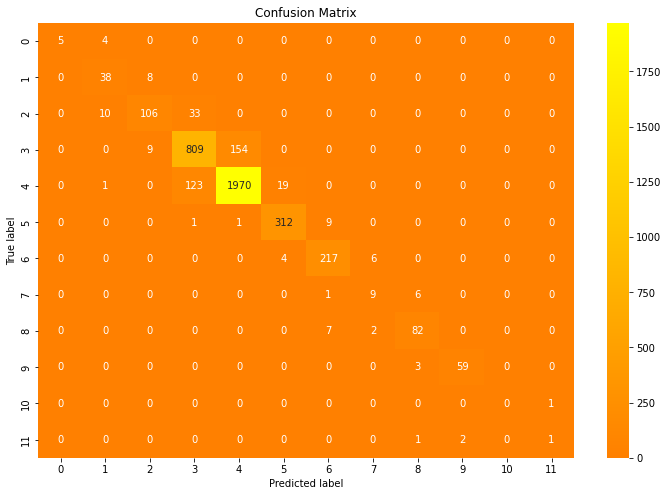

In [ ]:
cm_logreg = confusion_matrix(y_valid,y_predict_valid_logreg_cv)
draw_confusion_matrix(cm_logreg)

## DENSE DEEP NEURAL NETWORK



In [ ]:
# Get an idea of the shape of the data and type of the data
print(X_train.shape, X_valid.shape, y_train.shape, y_valid.shape)


(16051, 58) (4013, 58) (16051,) (4013,)


In [ ]:
#Get the number of features

n_features = X.shape[1]
n_features


58

###Feature selection for MLP models using variance threshold

Our dataset doesn't contain constant and quasi constant features, so we procedd with all the variables

In [ ]:
from sklearn.feature_selection import VarianceThreshold
sel = VarianceThreshold(threshold=0.1)
sel.fit(X_train)

VarianceThreshold(threshold=0.1)

In [ ]:
# get_support is a boolean vector that indicates which features are retained
# if we sum over get_support, we get the number of features that are not constant
sum(sel.get_support())

58

## BUILD THREE DIFFERNT MODEL WITH THREE DIFFERENT LAYERS

For our neural networks models.
We build three different models, each with different layers.
The first model with only one hidden dense layer and the second one with two and the third with three.
We chose 50 neurons for every single dense.
Selu activation was chosen as it has been proven to be very effecive over other activation measures such as elu and relu.
Beside this the selu model was chosen for its self normalisation function.
We also adopted a kernel initializer(lecun_normal), as reccomended by Aurelien[1].
For optimizer adam was chosen, which is proven to be very effective when compared to the popular sgd optimizer. We then created a dictionar and fitted  the three models through a function. The model with only one hidden layer produced the best results on both training and validation data.

We chose randomly chose 50 default neurons for each dense layer.

We then implemented grid search cv to search for optimal parameters to improve the model. For the number of optimal neurons we selected a number below the initial input neuron and another greater than the initial input neurons. This was done to have a roughly idea to know if we had increase or decrease the neurons. For our optmiser the grid search was between adam and nadam. We also grid search the number of epoch.


In [ ]:
#Function to build three different models

def create_custom_model(input_dim, output_dim,  n=1, name='model'):
    def create_model(neuron1=50,
                     activation='selu',
                     optimizer= 'adam'
                     ):
        # Create model
        #modeltt.add(keras.layers.InputLayer(input_shape=[58,]))
        model = keras.models.Sequential(name=name)
        model.add(keras.layers.InputLayer(input_shape=input_dim))
        for i in range(n):
            model.add(keras.layers.Dense(neuron1, activation=activation, kernel_initializer="lecun_normal",))
        model.add(keras.layers.Dense(output_dim, activation='softmax'))
        #optimizer = keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999)
        # Compile model
        model.compile(loss="sparse_categorical_crossentropy",
                      optimizer= optimizer,
                      metrics=['accuracy'])
        return model
    return create_model

models = [create_custom_model(n_features, 20, i, 'model_{}'.format(i))
          for i in range(1, 4)]

for create_model in models:
    create_model().summary()


Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 50)                2950      
                                                                 
 dense_1 (Dense)             (None, 20)                1020      
                                                                 
Total params: 3,970
Trainable params: 3,970
Non-trainable params: 0
_________________________________________________________________
Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 50)                2950      
                                                                 
 dense_3 (Dense)             (None, 50)                2550      
                                                                 
 dense_4 (Dense)             (None, 20) 

In [ ]:
#DEFINE CALLBACK PARAMETERS
early_stopping_cb = keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True)

In [ ]:
#Fit the models with an early call back

from keras.callbacks import TensorBoard

history_dict = {}


for create_model in models:
    model = create_model()
    print('Model name:', model.name)
    history_callback = model.fit(X_train, y_train,
                                 batch_size=10,
                                 epochs=50,
                                 verbose=0,
                                 validation_data=(X_valid, y_valid),
                                 callbacks=[early_stopping_cb])
    val_score_mlp = model.evaluate(X_valid, y_valid, verbose=0)
    print('Validation loss:', val_score_mlp[0])
    print('Validation accuracy:', val_score_mlp[1])

    train_score_mlp = model.evaluate(X_train, y_train, verbose=0)
    print('Training loss:', train_score_mlp[0])
    print('Training accuracy:', train_score_mlp[1])

    history_dict[model.name] = [history_callback, model]

Model name: model_1
Validation loss: 0.06881705671548843
Validation accuracy: 0.9763269424438477
Training loss: 0.01856258139014244
Training accuracy: 0.9962618947029114
Model name: model_2
Validation loss: 0.08585304766893387
Validation accuracy: 0.9673560857772827
Training loss: 0.03412352129817009
Training accuracy: 0.9870412945747375
Model name: model_3
Validation loss: 0.08079587668180466
Validation accuracy: 0.9720907211303711
Training loss: 0.015027542598545551
Training accuracy: 0.994828999042511


### MODEL VISUALISATION

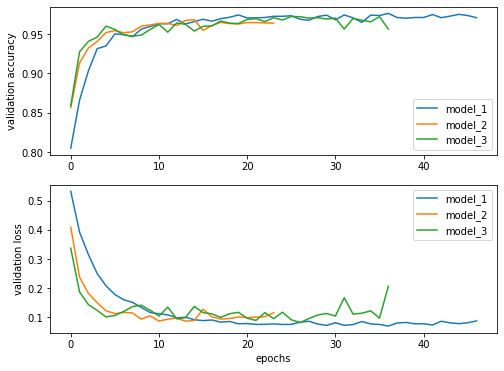

In [ ]:
#Plot Model Graph

fig, (ax1, ax2) = plt.subplots(2, figsize=(8, 6))

for model_name in history_dict:
    val_accurady = history_dict[model_name][0].history['val_accuracy']
    val_loss = history_dict[model_name][0].history['val_loss']
    ax1.plot(val_accurady, label=model_name)
    ax2.plot(val_loss, label=model_name)

ax1.set_ylabel('validation accuracy')
ax2.set_ylabel('validation loss')
ax2.set_xlabel('epochs')
ax1.legend()
ax2.legend();

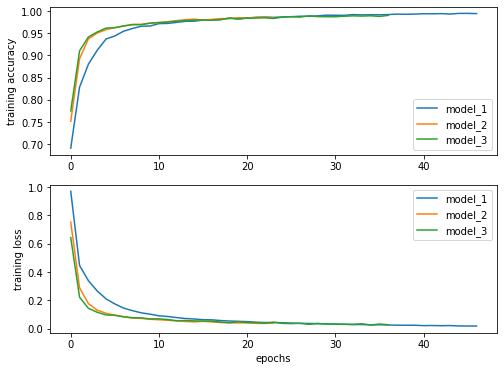

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(8, 6))

for model_name in history_dict:
    accurady = history_dict[model_name][0].history['accuracy']
    loss = history_dict[model_name][0].history['loss']
    ax1.plot(accurady, label=model_name)
    ax2.plot(loss, label=model_name)

ax1.set_ylabel('training accuracy')
ax2.set_ylabel('training loss')
ax2.set_xlabel('epochs')
ax1.legend()
ax2.legend();

Among the three initial models created, the one with only one hidden dense layer outperform the other 2.
This was then wrapped with a keras classifier from scikit learn with a batch size of 10 and epochs of 50.
The model was then evaluated with a three fold cross validation

In [ ]:
# BUILD AND MEASURE MODEL 1 PERFORMANCE WITH CROSS VALIDATION

from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import cross_val_score

create_model = create_custom_model(n_features, 20,  1)

estimator = KerasClassifier(build_fn=create_model, batch_size=10,
                                 epochs=50, verbose=0)


cv_scores_mlp = cross_val_score(estimator, X_train, y_train, cv=3)
print("Accuracy : {:0.2f} (+/- {:0.2f})".format(cv_scores_mlp.mean(), cv_scores_mlp.std()))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  if __name__ == '__main__':


Accuracy : 0.96 (+/- 0.00)


In [ ]:
train_mlp_model_cv = cv_scores_mlp.mean()
train_mlp_model_cv

0.9573235909144083

In [ ]:
estimator.fit(X_train, y_train)

In [ ]:
train_mlp_model = estimator.predict(X_train)
train_mlp_score= accuracy_score(y_train, train_mlp_model)
train_mlp_score

0.9953273939318422

In [ ]:
valid_mlp_model = estimator.predict(X_valid)
val_mlp_score= accuracy_score(y_valid, valid_mlp_model)
val_mlp_score


0.9683528532270123

### MODEL OPTIMISATION AND PARAMETERS TUNNING

We then implemented grid search cv to search for optimal parameters to improve the model. For the number of optimal neurons we selected a number below the initial input neuron and another greater than the initial input neurons. This was done to have a roughly idea to know if we had increase or decrease the neurons. We try to optimise our optmiser between adam and namam. We also grid search the number of epoch.

In [ ]:
estimator.get_params()


{'batch_size': 10,
 'build_fn': <function __main__.create_custom_model.<locals>.create_model>,
 'epochs': 50,
 'verbose': 0}

In [ ]:
from scipy.stats import reciprocal
from sklearn.model_selection import GridSearchCV


optimizer = ['adam', 'nadam']
neuron1 = [20,50,80]
epochs = [20,50,100]







In [ ]:


# Parameter space what we want explore
# Note that it exactly matches up to our build_model function parameters.

param_grids = dict( optimizer=optimizer, epochs = epochs, neuron1=neuron1)

grid = GridSearchCV(estimator=estimator,
                    param_grid=param_grids,
                    cv= 3,
                    verbose=0)


In [ ]:
#fit grid search
grid_results_mlp = grid.fit(X_train, y_train)

In [ ]:
# Print the best parameters that were found
print(grid_results_mlp.best_params_)
print(grid_results_mlp.best_score_)

{'epochs': 50, 'neuron1': 20, 'optimizer': 'adam'}
0.9720264673233032


In [ ]:
#Test models on validation and training set and print gridsearch best score cv

#Training score

train_results_mlp_opt = grid_results_mlp.predict(X_train)
train_accuracy_score_gridcv = accuracy_score(y_train, train_results_mlp_opt)

print('Training Score',train_accuracy_score_gridcv)


#Validation score

grid_results_mlp_pred = grid_results_mlp.predict(X_valid)
val_accuracy_score_gridcv = accuracy_score(y_valid, grid_results_mlp_pred)

print('Validation Score',val_accuracy_score_gridcv)

Training Score 0.991589309077316
Validation Score 0.9800647894343384


In [ ]:
cv_mlp_grid_bestscore =grid_results_mlp.best_score_
cv_mlp_grid_bestscore

0.9720264673233032

## WIDE AND DEEP NEURAL NETWORK

We also implemented a non sequential neural network model, Wide and Deep neural network. The network connects all or parts of the inputs directly to the output layer, and helps the neural network to learn both deep patterns (using the deep path) and simple rules(through the short path), in contrast to a regular MLP which forces all the data to flow through the full stack of layers.
 We first create an Input object, with the shape equivalent to the number of features in our dataset.
 Next we create a dense layer of 20 neurons(from our previous grid search), using elu activation function. This dense layer will called like a function and connect it with the input object.
 We hen create another hidden layer, and use as a funtion to conncect to the previuos hidden layer. Followed by a concatenate layer, to concanate the input and the output of the second hidden layer. Lastly we create an output layer with softmax activation function, and passing it the result of the concatenation and we define a keras model where we specify which input and output to use [2].



In [ ]:
#Build a wide and deep neural network model


input_df = keras.layers.Input(shape=n_features)
hidden1 = keras.layers.Dense(20, activation="elu")(input_df)
hidden2 = keras.layers.Dense(20, activation="elu")(hidden1)
concat = keras.layers.Concatenate()([input_df,hidden2])
output = keras.layers.Dense(20, activation="softmax")(concat)
modelwd = keras.Model(inputs=[input_df], outputs=[output])

In [ ]:
modelwd.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_66 (InputLayer)          [(None, 58)]         0           []                               
                                                                                                  
 dense_136 (Dense)              (None, 20)           1180        ['input_66[0][0]']               
                                                                                                  
 dense_137 (Dense)              (None, 20)           420         ['dense_136[0][0]']              
                                                                                                  
 concatenate (Concatenate)      (None, 78)           0           ['input_66[0][0]',               
                                                                  'dense_137[0][0]']          

In [ ]:
modelwd.compile(loss="sparse_categorical_crossentropy",
                  optimizer="adam",
                  metrics=["accuracy"])



In [ ]:
# Now fit the model
historywd = modelwd.fit(X_train, y_train, epochs=50, batch_size=10, validation_data=(X_valid, y_valid),  verbose=0, callbacks=[early_stopping_cb])

(0.0, 1.0)

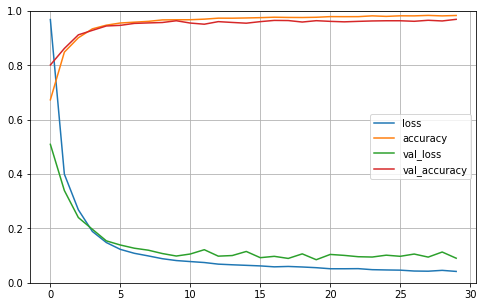

In [ ]:
#Plot model graph
import matplotlib.pyplot as plt

pd.DataFrame(historywd.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1) # set the vertical range to [0-1] plt.show()

In [ ]:
modelwd.save('mlp2.h5')

In [ ]:
from keras.models import load_model

modelwd= load_model('mlp2.h5')

In [ ]:


train_score_wd = modelwd.evaluate(X_train, y_train, verbose=0)
print('Training loss:', train_score_wd[0])
print('Training accuracy:', train_score_wd[1])

val_score_wd = modelwd.evaluate(X_valid, y_valid, verbose=0)
print('Validation loss:', val_score_wd[0])
print('Validation accuracy:', val_score_wd[1])




Training loss: 0.04021688923239708
Training accuracy: 0.984175443649292
Validation loss: 0.08493150770664215
Validation accuracy: 0.9643658399581909


In [ ]:
#cv_scores_wd = cross_val_score(modelwd, X_train, y_train, cv=3)
#print("Accuracy : {:0.2f} (+/- {:0.2f})".format(cv_scores_wd.mean(), cv_scores_wd.std()))

In [ ]:
#scorewd = modelwd.evaluate(X_valid, y_valid)
#print("Accuracy of the model %.2f%%" % ( scorewd[1]*100))

In [ ]:
#scorewd1 = modelwd.evaluate(X_train, y_train)
#print("Accuracy of the model %.2f%%" % ( scorewd1[1]*100))

### Model Tunning and Optimisation

In [ ]:
#Put the model in a function and compile

def build_wd (optimizer1 = 'adam', neurons=20):
  input_df = keras.layers.Input(shape=n_features)
  hidden1 = keras.layers.Dense(neurons, activation="elu")(input_df)
  hidden2 = keras.layers.Dense(neurons, activation="elu")(hidden1)
  concat = keras.layers.Concatenate()([input_df,hidden2])
  output = keras.layers.Dense(20, activation="softmax")(concat)
  modelwd = keras.Model(inputs=[input_df], outputs=[output])
  modelwd.compile(loss="sparse_categorical_crossentropy",
                  optimizer=optimizer1,
                  metrics=["accuracy"])
  return modelwd



In [ ]:
#Wrap mdels in object
estimatorwd = KerasClassifier(build_fn=build_wd, batch_size=10,
                                 epochs=50, verbose=0)



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
#Calculate cross validation score

cv_scores_wd = cross_val_score(estimatorwd, X_train, y_train, cv=3)
print("Accuracy : {:0.2f} (+/- {:0.2f})".format(cv_scores_wd.mean(), cv_scores_wd.std()))

Accuracy : 0.96 (+/- 0.00)


In [ ]:
cv_scores_wdmean=cv_scores_wd.mean()
cv_scores_wdmean


0.964363694190979

In [ ]:
#Define hyperparameters to tweak and see which one works best on using K-fold cross validation
optimizer1 =['sgd', 'adam']
batches = [5,10,15]
param_grid = dict (batch_size = batches, optimizer1 = optimizer1)

gridmw = GridSearchCV(estimator=estimatorwd, param_grid= param_grid, cv= 3,
                    verbose=0)
grid_results_wd= gridmw.fit(X_train, y_train)


In [ ]:
#Test on training and Validation set and print results
cv_accuracy_score_wd_grid= grid_results_wd.best_score_

print(grid_results_wd.best_params_)
print('CV Score (Best Score)', grid_results_wd.best_score_)

#Training score
train_grid_results_wd_pred = grid_results_wd.predict(X_train)
train_accuracy_score_wd_grid = accuracy_score(y_train, train_grid_results_wd_pred)

print('Train Set Score', train_accuracy_score_wd_grid)



#Validation Score
grid_results_wd_pred = grid_results_wd.predict(X_valid)
valid_accuracy_score_wd_grid = accuracy_score(y_valid, grid_results_wd_pred)

print('Validation Set Score', valid_accuracy_score_wd_grid)



{'batch_size': 15, 'optimizer1': 'sgd'}
CV Score (Best Score) 0.9644257028897604
Train Set Score 0.9895956638215687
Validation Set Score 0.9693496137552953


## TEST MODELS ON TEST DATA

In [ ]:
#scale the test set
X_test = scaler.transform(dft)

In [ ]:
#RELOAD TEST DATA WITH ID COLUMN NOT AS INDEX
test_csv = pd.read_csv("/content/test.csv")
col_test = test_csv['id']
col_test= np.asarray(col_test)

### LOGISTIC REGRESSION

In [ ]:
#Non scaled Log Evaluation

mod_log = logreg.predict(dft)
mod_log_sca = pipe.predict(X_test)
mod_log_sca_opt = logreg_cv_res.predict(X_test)

In [ ]:
#Save  modelmlp into a dataframe
mod_log_pred= pd.DataFrame({'id': col_test, 'Grade': (mod_log)}, columns=['id', 'Grade'])
mod_log_pred.to_csv(("submod_log.csv"), index=False)

In [ ]:
#Submit model to Kaggle
!kaggle competitions submit -c cs98x-22-dl-task2 -f submod_log.csv -m "Message"

100% 524/524 [00:04<00:00, 126B/s]
Successfully submitted to CS98X-22-DL-Task2

In [ ]:
#Save  modelmlp into a dataframe
mod_log_sca_pred= pd.DataFrame({'id': col_test, 'Grade': (mod_log_sca)}, columns=['id', 'Grade'])
mod_log_sca_pred.to_csv(("submod_log_pred.csv"), index=False)

In [ ]:
#Submit model to Kaggle
!kaggle competitions submit -c cs98x-22-dl-task2 -f submod_log_pred.csv -m "Message"

100% 523/523 [00:04<00:00, 128B/s]
Successfully submitted to CS98X-22-DL-Task2

In [ ]:
#Save  modelmlp into a dataframe
mod_log_sca_opt_pred= pd.DataFrame({'id': col_test, 'Grade': (mod_log_sca_opt)}, columns=['id', 'Grade'])
mod_log_sca_opt_pred.to_csv(("submod_log_sca_opt.csv"), index=False)

In [ ]:
#Submit model to Kaggle
!kaggle competitions submit -c cs98x-22-dl-task2 -f submod_log_sca_opt.csv -m "Message"

100% 524/524 [00:06<00:00, 86.2B/s]
Successfully submitted to CS98X-22-DL-Task2

NEURAL NETWORK

In [ ]:
#predict MLP neural network on text data
mod_mlp = estimator.predict(X_test)
mod_mlp_opt = grid_results_mlp.predict(X_test)

In [ ]:
#Save MLP model into a dataframe
mod_mlp_pred= pd.DataFrame({'id': col_test, 'Grade': (mod_mlp)}, columns=['id', 'Grade'])
mod_mlp_pred.to_csv(("submod_mlp.csv"), index=False)

In [ ]:
#Submit model to Kaggle
!kaggle competitions submit -c cs98x-22-dl-task2 -f submod_mlp.csv -m "Message"

100% 523/523 [00:03<00:00, 131B/s]
Successfully submitted to CS98X-22-DL-Task2

In [ ]:
#Save MLP optimise model into a dataframe
mod_mlp_opt_pred= pd.DataFrame({'id': col_test, 'Grade': (mod_mlp_opt)}, columns=['id', 'Grade'])
mod_mlp_opt_pred.to_csv(("submod_mlp_opt.csv"), index=False)

In [ ]:
#Submit model to Kaggle
!kaggle competitions submit -c cs98x-22-dl-task2 -f submod_mlp_opt.csv -m "Message"

100% 523/523 [00:04<00:00, 113B/s]
Successfully submitted to CS98X-22-DL-Task2

### WIDE AND DEEP NEURAL NETWORK

In [ ]:
#Predict Wide and Deep Models on test data
mod_wd = modelwd.predict(X_test)
mod_wd_opt = grid_results_wd.predict(X_test)


In [ ]:
mod_wd = mod_wd.round(2) #round model to integers
mod_wd = np.argmax(mod_wd,axis=1) #return the indices of the maximum values
mod_wd

array([ 9,  9,  9,  9,  9,  9,  9,  8, 14,  9,  9,  9,  9,  9,  9, 11,  9,
        9, 11,  9,  9,  9, 11,  8,  8,  6,  7,  8,  9,  9,  9,  9, 14,  8,
        9,  8,  9,  9,  9,  8,  9,  8, 11,  9, 11,  9, 11,  9, 10,  9,  9,
        9, 10,  9, 11,  9,  8,  9, 11,  8,  9, 10,  9,  9,  9,  9,  8,  9,
        9,  9,  8,  9,  9,  9, 10,  8,  9,  9,  8,  9,  9,  9,  9,  9,  8,
       13,  8,  9,  6,  9,  9,  8, 13,  9,  9,  9,  9,  7,  9, 10, 10])

In [ ]:
#Save Wide and Deep model into a dataframe
mod_wd_pred= pd.DataFrame({'id': col_test, 'Grade': (mod_wd)}, columns=['id', 'Grade'])
mod_wd_pred.to_csv(("submod_wd.csv"), index=False)

In [ ]:
#Save Wide and Deep optimise model into a dataframe
mod_wd_opt_pred= pd.DataFrame({'id': col_test, 'Grade': (mod_wd_opt)}, columns=['id', 'Grade'])
mod_wd_opt_pred.to_csv(("submod_wd_opt.csv"), index=False)

In [ ]:
#Submit model to Kaggle
!kaggle competitions submit -c cs98x-22-dl-task2 -f submod_wd.csv -m "Message"

100% 523/523 [00:04<00:00, 125B/s]
Successfully submitted to CS98X-22-DL-Task2

In [ ]:
#Submit model to Kaggle
!kaggle competitions submit -c cs98x-22-dl-task2 -f submod_wd_opt.csv -m "Message"

100% 523/523 [00:03<00:00, 142B/s]
Successfully submitted to CS98X-22-DL-Task2

### EXPORT RESULTS TO KAGGLE

#FINDINGS
In this project the neural network model employed is based on the popular multilayer perceptron with one hidden layer and a functional neural network, wide and deep with two hidden layers

All experiments were conducted using google colab with sklearn library, matplotip, pandas, tenserflow and few other libraries.




# RESULTS AND DISCUSSION

The findings of this project are summarise in the table below.
The dataset were modeled using three classification approaches, logistic regression, multilayer perceptron layer and wide and deep neural network. The best results were obtained by the Multilayer perceptron model with only one dense hidden layer. This stays in line with many researches which confirms that non linear functions capability of obtaining better results when a high non linearity is present[3].

#### Logistic Regression model Analysis

The logistic regression model fitted on scale data  out-performed the logistic regression model on non-scale data on all the dataset and cross validationset, but had the same prediction rate on the final test data. The model was then regularise with elastic net, which combines the L1 and L2 penalties of the lasso and ridge method, mainly to find a reduced set of variables by shrinking the the coefficients of the less contributive variable towards zero. The penalised model performed better than both the model with scale and non scale data.
#### Model performance mismatch
For the logistic regression model, while all train, validation and Cv dataset scores between 87% and 90%, the test produce an accuracy score between 94% and 96% outperforming all the training, validation and cv results. This can be attributed to the source of data or un equal distribution between the train and test sample.

#### The non linear models (multiple layer perceptron and wide&deep)

The two non linear models implemented in this study outperformed the logistic regression models. From the table below we can observe that, the MLP model with selu initialiser and 50 neurons performed really well, having an 100% accuracy rate on our test data and 98% rate on the validation data. The hyperparameters were tuned with the optimser selection between adam and nadam, with a new model fitted with only 20 neurons and adam optimeser.

#### Wide and Deep
The wide and deep tune with a batch size of 15 and sgd optimiser also performed better than the one with batch size 10 and adam optimiser.


In [ ]:
Modelsummarydata = {'Train_Data': [train_accuracy_score_logreg, train_accuracy_score_logreg_sca, train_accuracy_score_logreg_cv, train_accuracy_score_gridcv, train_mlp_score, train_score_wd[1], train_accuracy_score_wd_grid],
                'Validation_Set': [valid_accuracy_score_logreg, valid_accuracy_score_logreg_sca, valid_accuracy_score_logreg_cv, val_accuracy_score_gridcv, val_mlp_score, val_score_wd[1], valid_accuracy_score_wd_grid],
                'Cross_Val_score': ['N/A', cv_logregm, cv_accuracy_score_logreg_cv, train_mlp_model_cv, cv_mlp_grid_bestscore, cv_scores_wdmean, cv_accuracy_score_wd_grid],
                'Test_Set': [0.94000, 0.94000, 0.96000, 1.00000, 1.00000, 0.96000, 0.98000],
                'Parameters': ['max_iter=1000, multi_class=multinomial', 'max_iter=1000, multi_class=multinomial', 'l1_ratio:1, penalty: elasticnet, solver: saga', 'epochs: 50, neuron1: 50, optimizer: adam', 'epochs: 50, neuron1: 20, optimizer: adam', 'batch_size: 10, optimizer1:adam','batch_size: 15, optimizer1:sgd']

                }

modelsummary = pd.DataFrame(Modelsummarydata, index=['Logistic Regression(Non-Scaled Data)', 'Logistic Regression(Scaled Data)', 'Logistic Regression(Model Tunning)', 'MLP' , 'MLP Tune Parameters', 'Wide&Deep Neural Net','Wide&Deep Neural Net (Tune Parameters)'])



In [ ]:
modelsummary

,Train_Data,Validation_Set,Cross_Val_score,Test_Set,Parameters
Logistic Regression(Non-Scaled Data),0.886736,0.875405,N/A,0.94,"max_iter=1000, multi_class=multinomial"
Logistic Regression(Scaled Data),0.901813,0.891104,0.88549,0.94,"max_iter=1000, multi_class=multinomial"
Logistic Regression(Model Tunning),0.907669,0.899078,0.899072,0.96,"l1_ratio:1, penalty: elasticnet, solver: saga"
MLP,0.991589,0.980065,0.957324,1.00,"epochs: 50, neuron1: 50, optimizer: adam"
MLP Tune Parameters,0.995327,0.968353,0.972026,1.00,"epochs: 50, neuron1: 20, optimizer: adam"
Wide&Deep Neural Net,0.984175,0.964366,0.964364,0.96,"batch_size: 10, optimizer1:adam"
Wide&Deep Neural Net (Tune Parameters),0.989596,0.969350,0.964426,0.98,"batch_size: 15, optimizer1:sgd"


# SUMMARY AND RECCOMENDATION

   The objective of this task was to adopt machine learning models to pridict the final student grade. For this analysis we adopted a logistic regression model (optimised with elaticnet regularisation) and two deep learning based models. The results shows that a good predictive model can be achieved with deep learnng approach as they outperform the baseline logistic regression model. The two deepp learning base approaches provided an accuracy score percentage over 96% on cross validation, training, validation and test set, while the logistic regression reached a maximum of 96% accuracy on test score. The Multiple layer perceptron with selu regularisation performed better on all the tests performed when compared to the wide and deep model. Although the MLP model outperformed the wide and deep learning model it took too much processing time  when compared to the wide and deep which converged faster. The trade-off here is between precision and time.

## Limitations
Theres room for improvement for all models employed in this research, the main difficulty faced in this research is time and resources (adeguate machinery capable of processing data faster). Large number of parameters could have been explored to optmise our models if faster computer systems were at disposition.


REFERENCES

GeÌron, A. (2019). Hands-on machine learning with Scikit-Learn, Keras and TensorFlow: concepts, tools, and techniques to build intelligent systems (2nd ed.). O’Reilly [1].

Cheng, Heng-Tze & Koc, Levent & Harmsen, Jeremiah & Shaked, Tal & Chandra, Tushar & Aradhye, Hrishi & Anderson, Glen & Corrado, G.s & Chai, Wei & Ispir, Mustafa & Anil, Rohan & Haque, Zakaria & Hong, Lichan & Jain, Vihan & Liu, Xiaobing & Shah, Hemal. (2016). Wide & Deep Learning for Recommender Systems [2].

P. Cortez and A. Silva. Using Data Mining to Predict Secondary School Student Performance. In A. Brito and J. Teixeira Eds., Proceedings of 5th FUture BUsiness TEChnology Conference (FUBUTEC 2008) pp. 5-12, Porto, Portugal, April, 2008, EUROSIS, ISBN 978-9077381-39-7 [3].